In [2]:
#pip install snscrape

Note: you may need to restart the kernel to use updated packages.


In [3]:
#pip install spacy

Note: you may need to restart the kernel to use updated packages.


In [4]:
import snscrape.modules.twitter as sntwitter
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import spacy
from spacy import displacy
from collections import Counter
import en_core_web_sm
nlp = en_core_web_sm.load()
from nltk.tag import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer
from nltk.corpus import stopwords
import string
import nltk
from nltk.tokenize import word_tokenize
from textblob import TextBlob

In [5]:
# Setting variables to be used below
maxTweets = 30000

# Creating list to append tweet data to
tweets_list = []

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper('BloodSisters since:2022-04-25 until:2022-05-09').get_items()):
    if i>maxTweets:
        break
    tweets_list.append([tweet.date, tweet.id, tweet.content, tweet.user.username,  tweet.likeCount, tweet.location])

<ipython-input-5-9a40c31adc3c>:11: FutureWarning: username is deprecated, use user.username instead
  tweets_list.append([tweet.date, tweet.id, tweet.content, tweet.username,  tweet.likeCount])


In [6]:
#Creating a dataframe from the tweets list above


df = pd.DataFrame(tweets_list, columns=['datetime', 'tweet_Id', 'text', 'Username','Likes','location'])

# Display first 5 entries from dataframe
data.head()

,datetime,tweet_Id,text,Username,Likes
0,2022-05-08 23:59:14+00:00,1523452499167875072,Blood sisters was so good 🥺,AnnabelHalliday,0
1,2022-05-08 23:58:31+00:00,1523452315604201472,fine. i’ll watch blood sisters,thscarlettbitch,0
2,2022-05-08 23:58:14+00:00,1523452247794798593,Pastor please stick to ur mount Zion movies an...,PoPolampoh1,1
3,2022-05-08 23:58:14+00:00,1523452246817591296,The Blood Sisters series get some K-legs.,TAIWOZEEZ,1
4,2022-05-08 23:57:14+00:00,1523451994908016640,In that #BloodSisters the Kenny that played si...,Abilar1,0


In [8]:
# read data into a dataframe
data =pd.read_csv('Bloodsisterstweets.csv')

In [9]:
data.shape

(26415, 6)

In [10]:
tweet

Tweet(url='https://twitter.com/Macaco_Falante_/status/1518401241138843649', date=datetime.datetime(2022, 4, 25, 1, 27, 21, tzinfo=datetime.timezone.utc), content='@lemonadehearts Blood sisters beloved 🥺🥺🥺', renderedContent='@lemonadehearts Blood sisters beloved 🥺🥺🥺', id=1518401241138843649, user=User(username='Macaco_Falante_', id=1618765160, displayname='Mako 🏆🕊🎐', description='Game Dev, crochê e pixel art\n\nAs vezes curto coisas 🔞.\n\nSometimes I like 🔞 stuff\n\nIcon by @p2eocene\n\nBanner by @paulozadias\n\nEle/Dele\nHe/Him', rawDescription='Game Dev, crochê e pixel art\n\nAs vezes curto coisas 🔞.\n\nSometimes I like 🔞 stuff\n\nIcon by @p2eocene\n\nBanner by @paulozadias\n\nEle/Dele\nHe/Him', descriptionUrls=None, verified=False, created=datetime.datetime(2013, 7, 24, 22, 29, 28, tzinfo=datetime.timezone.utc), followersCount=173, friendsCount=1105, statusesCount=28965, favouritesCount=89806, listedCount=1, mediaCount=1173, location='Vila Velha-ES-Brasil', protected=False, linkUrl=N

In [14]:
#convert the datetime to date
data.datetime= pd.to_datetime(data.datetime).dt.date

In [15]:
# view the data frame again
data.head()

,Unnamed: 0,datetime,tweet_Id,text,Username,Likes
0,0,2022-05-08,1523452499167875072,Blood sisters was so good 🥺,AnnabelHalliday,0
1,1,2022-05-08,1523452315604201472,fine. i’ll watch blood sisters,thscarlettbitch,0
2,2,2022-05-08,1523452247794798593,Pastor please stick to ur mount Zion movies an...,PoPolampoh1,1
3,3,2022-05-08,1523452246817591296,The Blood Sisters series get some K-legs.,TAIWOZEEZ,1
4,4,2022-05-08,1523451994908016640,In that #BloodSisters the Kenny that played si...,Abilar1,0


In [16]:
#group counts of tweets by date
dt=data.groupby('datetime').size()
dt

datetime
2022-04-25      40
2022-04-26      32
2022-04-27      36
2022-04-28      40
2022-04-29      26
2022-04-30      24
2022-05-01      54
2022-05-02      37
2022-05-03      79
2022-05-04     686
2022-05-05    6461
2022-05-06    7083
2022-05-07    6488
2022-05-08    5329
dtype: int64

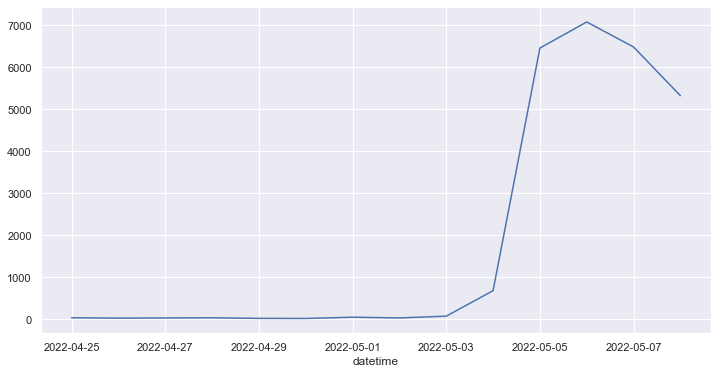

In [17]:
#plot linechat of tweets by day
sns.set(rc = {'figure.figsize':(12,6)})
sns.lineplot(err_style="bars",data = dt);

In [18]:
#clean the tweets and add a new column of the clean data
def cleaner(tweet):
    tweet = re.sub("@[A-Za-z0-9]+","",tweet) #Remove @ sign
    tweet = re.sub(r"(?:\@|http?\://|https?\://|www)\S+", "", tweet) #Remove http links
    tweet = " ".join(tweet.split())
    #tweet = ''.join(c for c in tweet if c not in emoji.UNICODE_EMOJI['en']) #Remove Emojis
    tweet = tweet.replace("#", "").replace("_", " ") #Remove hashtag sign but keep the text
    return tweet
data['clean'] = data['text'].map(lambda x: cleaner(x))

In [ ]:
data.sort_values(by = ["Likes"],ascending = False,inplace = True)

In [ ]:
del data['Unnamed: 0']

In [19]:
#view the new data frame
data.head()

,Unnamed: 0,datetime,tweet_Id,text,Username,Likes,clean
0,0,2022-05-08,1523452499167875072,Blood sisters was so good 🥺,AnnabelHalliday,0,Blood sisters was so good 🥺
1,1,2022-05-08,1523452315604201472,fine. i’ll watch blood sisters,thscarlettbitch,0,fine. i’ll watch blood sisters
2,2,2022-05-08,1523452247794798593,Pastor please stick to ur mount Zion movies an...,PoPolampoh1,1,Pastor please stick to ur mount Zion movies an...
3,3,2022-05-08,1523452246817591296,The Blood Sisters series get some K-legs.,TAIWOZEEZ,1,The Blood Sisters series get some K-legs.
4,4,2022-05-08,1523451994908016640,In that #BloodSisters the Kenny that played si...,Abilar1,0,In that BloodSisters the Kenny that played sim...


In [20]:
pip install wordCloud

Note: you may need to restart the kernel to use updated packages.


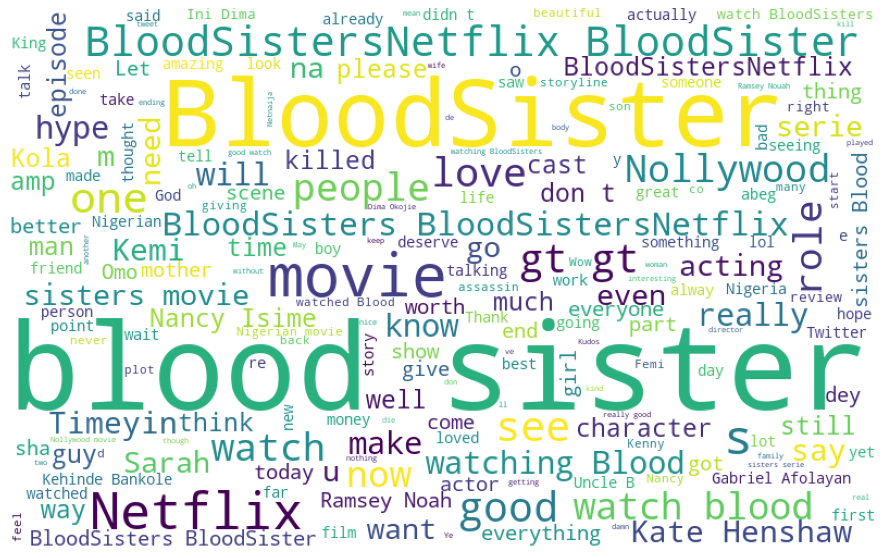

In [21]:
#create a wordcloud to view the most used words in the clean tweets

all_words = ' '.join([text for text in data['clean']])
from wordcloud import WordCloud
wordcloud = WordCloud(background_color = 'white', width=800, height=500, random_state=21, max_font_size=110).generate(all_words)

plt.figure( figsize=(20,10) )
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [22]:
# extract tokens using spacy library
tokenizer = nlp.tokenizer
tokens = tokenizer(''.join(str(data.clean.tolist())))

In [23]:
#show tokens and entity 
doc = nlp(tokens)


for ent in doc.ents:
    print(ent.text,  ent.label_)

G.O. Akpi ORG
The Blood Sisters WORK_OF_ART
BloodSisters ORG
Kenny PERSON
Timeyin ORG
BloodSisters ORG
Shine PERSON
Fiancé PERSON
BloodSisters ORG
100/100 CARDINAL
BloodSisters ORG
BloodSisters Amvca' PERSON
Lol ORG
first ORDINAL
Kate PERSON
Blood ORG
Genevieve PERSON
Tony Umez PERSON
Omotola PERSON
Blood PERSON
Hollywood/Bollywood/Nollywood ORG
BloodSisters BloodSistersNetflix' PERSON
Dem NORP
KOT ORG
Dear K I WORK_OF_ART
1min CARDINAL
Attitude PRODUCT
👌 ORG
Sky Castle ⭐ ORG
⭐ ORG
Edén ORG
BloodSisters ORG
Netnaija ORG
Uncle B WORK_OF_ART
BloodSistersNetflix BloodSisters PERSON
2 CARDINAL
Blood Sisters WORK_OF_ART
Netflix GPE
BloodSisters ORG
Blood Sisters PERSON
Kemi GPE
Chicago PERSON
BloodSistersNetflix BloodSisters' PERSON
One CARDINAL
🤗 ORG
MothersDay BloodSisters' PERSON
Blood Sisters PERSON
BloodSisters ORG
😩 Netflix PERSON
B Played PERSON
Blood Sisters PERSON
Blood ORG
later in the morning TIME
42 CARDINAL
32 years old DATE
BloodSistersNetflix BloodSisters PERSON
👏 ORG
BloodSi

Laycon ORG
Jordan GPE
YouTube ORG
Ricordi PERSON
Blood Sisters GPE
Saw Blood Sisters PERSON
Sarah o Le PERSON
Bloodsisters Timeyin ORG
18+ DATE
Steve Blood Sisters Series PERSON
Nollywood GPE
Timiyen PERSON
Uncle PERSON
Blood Sisters PERSON
5/10 CARDINAL
mid' DATE
Kenny PERSON
Blood GPE
NTA ORG
AIT ORG
u dey here ORG
Peer PRODUCT
Blood PERSON
TT ORG
😩 PERSON
Nigerian NORP
🇳 PRODUCT
👏 ORG
🏽 ORG
👏 ORG
🏽 ORG
👏 ORG
Showering Naked PERSON
Blood Sisters WORK_OF_ART
\u200d PRODUCT
Nollywood GPE
Netflix GPE
Tye Witcher' PERSON
Kola ORG
BloodSisters ORG
Assassin NORP
🤣 ORG
🤣 PRODUCT
two CARDINAL
8/10 CARDINAL
Ramsey PERSON
Kate Henshaw's PERSON
Mummy Joke Silver PERSON
NollywoodFilmClub VGMA23 PERSON
BloodSisters ORG
Netflix ORG
Blood ORG
Yesterday DATE
\U0001fae0 PERSON
Blood Sisters PERSON
😒 TIME
😒 TIME
😒 TIME
Blood Sisters WORK_OF_ART
Bloodsisters ORG
🚦 GPE
Nigerian NORP
BloodSistersNetflix PERSON
this Shola Holmes ORG
Blood Sisters PERSON
two CARDINAL
Blood Sisters PERSON
😏😏 PERSON
Nollywoo

🤣 ORG
🤣 PRODUCT
🤣 ORG
🤣 ORG
🤣 ORG
🤣BloodSistersNetflix BloodSisters' ORG
season film DATE
BloodSisters ORG
Yinka BloodSisters' ORG
Nollywood PERSON
Costume & ORG
Makeup, Location and Overall Acting ORG
🤗 BloodSisters WORK_OF_ART
😩😩 PERSON
😩 PERSON
😒 CARDINAL
BloodSisters ORG
5.5/10 CARDINAL
the Omotola and Genevieve "Blood Sisters" Make ORG
The Set Up WORK_OF_ART
Mama Drama PERSON
the 1st DATE
Blood Sisters 😊 WORK_OF_ART
BloodSistersNetflix PERSON
BloodSisters ORG
Nahhh PERSON
Blood Sisters PERSON
Blood Sisters PERSON
summer DATE
Blood PERSON
the ‘Blood Sisters’ ORG
1 CARDINAL
2 CARDINAL
3 CARDINAL
4 CARDINAL
5 CARDINAL
Ramsey Noah PERSON
Nigerian NORP
Vin Diesel PERSON
early 2000s DATE
🤣 ORG
Abasiama in Blood PERSON
Toke Makinwa ORG
Blood Sisters WORK_OF_ART
Bathong GPE
BloodSistersNetflix BloodSisters' PERSON
BloodSisters ORG
Blood Sisters WORK_OF_ART
Netflix GPE
’m CARDINAL
Nigerian NORP
Nigerian NORP
👏 ORG
Omotola GPE
BloodSisters ORG
TOL ORG
BloodSisters ORG
Netflix GPE
Netflix GP

🤣 ORG
🤣 PRODUCT
Chicago GPE
Black American WORK_OF_ART
Nollywood GPE
Yinka PERSON
😂 PERSON
BloodSistersNetflix PERSON
Blood Sisters GPE
Yolanda Okereke's PERSON
Shei PERSON
first ORDINAL
BloodSisters ORG
Hnm PERSON
10/10 CARDINAL
👏🏾👏🏾' ORG
BloodSisters ORG
😓 DATE
✨ ORG
3 CARDINAL
4 CARDINAL
3 CARDINAL
half CARDINAL
8 CARDINAL
💭 Free ORG
Ajegunle Timeyin BloodSisters ORG
BloodSistersNetflix BloodSisters' PERSON
Gabriel Afolayan PERSON
Genoveva Umeh PERSON
TheCable Lifestyle' ORG
BloodSisters ORG
week DATE
BloodSisters ORG
Netflix ORG
Chicago GPE
Nollywood GPE
🤔 CARDINAL
💭 Free ORG
Ajegunle Timeyin BloodSisters ORG
Emmys GPE
Lol PERSON
Bloodsisters ORG
Sunday DATE
evening TIME
The Bride's Entrance WORK_OF_ART
BloodSisters ORG
non-Nigerians NORP
the Blood Sisters FAC
Queen PERSON
BloodSisters ORG
Blood Sisters WORK_OF_ART
daily DATE
BloodSistersNetflix PERSON
BloodSisters ORG
BloodSisters ORG
💭 Free PERSON
Ajegunle Timeyin BloodSisters ORG
Blood GPE
tonight TIME
Love WORK_OF_ART
BloodSist

Sunday DATE
March DATE
BloodSistersNetflix BloodSisters ORG
MothersDay ORG
Kola PERSON
BloodSisters ORG
🤩 ORG
BloodSisters ORG
Dutch NORP
Daniel Lojay PERSON
13 CARDINAL
Cameron Reno ASUU PERSON
6 CARDINAL
NollywoodFilmClub PERSON
Nah PERSON
BloodSisters ORG
Daniel Lojay PERSON
13 CARDINAL
Cameron Reno ASUU PERSON
6 CARDINAL
Uncle B PERSON
Ade Tiger PERSON
🤣 ORG
Blood Sisters FAC
Kenny PERSON
2837292728273836273837 CARDINAL
Heei God' PERSON
Netflix ORG
Sarah & ORG
BloodSistersNetflix BloodSisters' ORG
BloodSisters ORG
MothersDay PERSON
Blood Sisters PERSON
Iykyk PERSON
BloodSisters ORG
Breakfaststories ORG
yen yen yen MONEY
first ORDINAL
BloodSisters ORG
Nigerian NORP
12 CARDINAL
Twitter PRODUCT
Blood GPE
Nigerian NORP
first ORDINAL
this morning TIME
😹😹😹' PERSON
house 😭 ORG
Oga Solo PERSON
Ramsey Nouah PERSON
🏽 BloodSisters PERSON
BloodSisters ORG
Nah PERSON
BloodSisters ORG
Assassin PERSON
🤣 ORG
Blood Sisters on WORK_OF_ART
10/10 CARDINAL
Blood Sisters PR PERSON
third ORDINAL
Una ORG


BloodSisters ORG
KOB ORG
Omor Blood PERSON
✨ PRODUCT
ABC ORG
the 18th century DATE
Pulitzer Prize WORK_OF_ART
Blood Sisters PERSON
😂 PERSON
BloodSisters ORG
Blood PERSON
year DATE
Met PRODUCT
Kate Henshaw's PERSON
BloodSisters ORG
3 CARDINAL
Kola’s ORG
BloodSisters ORG
\u200d♂️🤦 PRODUCT
BloodSisters ORG
06 CARDINAL
Blood Sisters PERSON
BloodSisters ORG
Bloodsisters ORG
u stream ORG
Xender u PERSON
Netnaija ORG
Rest PERSON
10 CARDINAL
first ORDINAL
BloodSistersNetflix BloodSisters' PERSON
Kiri PERSON
🤣 ORG
🤣 ORG
BloodSisters BloodSistersNetflix' ORG
Kate PERSON
Ade PERSON
Ramsey PERSON
KOB ORG
Blood GPE
7 CARDINAL
KOB ORG
One CARDINAL
BloodSisters ORG
10/10 CARDINAL
🤣 ORG
BloodSisters ORG
Netflix PERSON
BloodSisters ORG
African NORP
BloodSisters BloodSistersNetflix' ORG
BloodSisters BloodSistersNetflix' ORG
Nollywood PERSON
Netflix ORG
One CARDINAL
WhatsApp ORG
it\ ORG
One CARDINAL
5 CARDINAL
Kemi GPE
Sarah PERSON
Blood Sisters' GPE
Netflix ORG
😉' PERSON
10/10 CARDINAL
BloodSisters ORG


Space PRODUCT
NollywoodFilmClub PERSON
BloodSisters ORG
Netnaija ORG
Sunday DATE
BloodSisters BloodSistersNetflix' PERSON
BloodSisters ORG
Squid ORG
today DATE
AGIDI WORK_OF_ART
today DATE
Mo Abudu PERSON
2 CARDINAL
10 CARDINAL
BloodSisters ORG
yesterday DATE
Genevieve PERSON
😂 ORG
😂 PERSON
BloodSisters BloodSistersNetflix' PERSON
Lawrenz Make PERSON
duno PERSON
Kola PERSON
BloodSisters ORG
BloodSisters ORG
Netflix Ade PERSON
Jacky Chan PERSON
castle & ORG
7/10 CARDINAL
last night TIME
Nigerian NORP
Kate Henshaw PERSON
Blood Sisters PERSON
Two CARDINAL
Netflix GPE
fr fr😔 PERSON
Baba Segi PERSON
Blood Sisters' PERSON
BloodSisters 🥂' ORG
today DATE
NPF ORG
Netflix GPE
BloodSisters ORG
first ORDINAL
Blood Sisters WORK_OF_ART
four CARDINAL
Ketu PERSON
Ramsey Nouah PERSON
🤣 BloodSisters' ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
NetNaija ORG
TrendingNow ORG
Blood Sister WORK_OF_ART
🤣 WORK_OF_ART
Blood Sisters WORK_OF_ART
BloodSisters ORG
Bloodsisters Castle & ORG
Castle ORG
Blo

BloodSisters ORG
🙏 ORG
kola’s ORG
BloodSistersNetflix BloodSisters' PERSON
Blood Sisters PERSON
Netflix ORG
Y'all WORK_OF_ART
Nawa PERSON
BloodSisters ORG
Fregz Bro PERSON
🤣 BloodSistersNetflix BloodSisters ORG
Yh Blood PERSON
Kate Henshaw PERSON
Blood Sisters GPE
Naija News & ORG
Nigerian Newspaper Headlines ORG
Today, 8th May 2022 DATE
Nigerian Newspaper Headlines ORG
BloodSisters ORG
Bloodsisters ORG
Osinachi Nwachukwu ORG
BloodSistersNetflix MothersDay PERSON
Yinka PERSON
BloodSisters ORG
Love WORK_OF_ART
Igbo GPE
Blood Sisters PERSON
Today DATE
Sunday DATE
👏 ORG
NTA ORG
last night TIME
Justin Bieber PERSON
Blood Sisters GPE
BloodSistersNetflix BloodSisters' ORG
Blood Sisters WORK_OF_ART
Timeyin ORG
BloodSisters ORG
🎂 CARDINAL
🎉 ORG
🎂 WORK_OF_ART
Je vais PERSON
the same day DATE
BloodSisters ORG
madams don PERSON
Merlin GPE
Spider PERSON
3000 CARDINAL
Nancy PERSON
African NORP
kmt ORG
BloodSisters ORG
Makoko GPE
BloodSisters ORG
😔 ORG
Héll PERSON
BloodSistersNetflix BloodSisters' P

Mo Abudu PERSON
Kemi Adetiba PERSON
Bloodsisters ORG
20yrs ago TIME
TF BloodSisters' ORG
BloodSistersNetflix Bloodsisters ORG
Bestfriend BloodSistersNetflix' PERSON
Blood GPE
Kenny PERSON
Ade Tiger PERSON
Blood Sisters Cast WORK_OF_ART
Netflix 2022 TV Series Features Top Nollywood Stars' ORG
BloodSisters ORG
Blood Sisters PERSON
K8 10shaw GPE
Ozokwor PERSON
Canada Netflix PERSON
BloodSisters ORG
BloodSisters ORG
Omutola GPE
MTN & ORG
GLO ORG
Chioma/super tv ORG
1 CARDINAL
BloodSisters & ORG
2hr DATE
Nollywood GPE
5 CARDINAL
2nd DATE
Bloodsisters ORG
Moonknight NORP
3 CARDINAL
5 CARDINAL
the night TIME
US GPE
Naija’s ORG
1 CARDINAL
Blood Sisters GPE
WritingCommunity ORG
The Wedding Party ORG
TikTok PRODUCT
Genoveva Umeh PERSON
Blood Sisters GPE
Church ORG
Bloodsisters Nancyisime ORG
Bloodsisters ORG
Nollywood PERSON
Kenny GPE
Blood Sisters GPE
Lol PERSON
Netflix ORG
4 CARDINAL
🤣 ORG
🤣 ORG
😉 PERSON
😉👌 - 🎥 PERSON
Nigeria GPE
BloodSisters ORG
more than 20 CARDINAL
just 3 days DATE
Blood Si

😂 PERSON
😂 PERSON
8/10 CARDINAL
BloodSisters ORG
BloodSisters ORG
First ORDINAL
Netflix BloodSisters PERSON
ça se fini PERSON
comme ça ? PERSON
Bella38 Watch Blood PERSON
Netflix GPE
BloodSistersNetflix BloodSisters PERSON
Inidima Okojie PERSON
BloodSisters BloodSistersNetflix' ORG
5/10 CARDINAL
Nollywood PERSON
Nigeria GPE
BloodSisters ORG
BloodSisters ORG
Blood Sisters WORK_OF_ART
😩😩😩' PERSON
Voice Note ORG
9ja ORDINAL
Abi PERSON
Hollywood GPE
BloodSisters ORG
BloodSisters ORG
4/10 CARDINAL
Kate Henshaw's PERSON
This Blood Sisters WORK_OF_ART
BlOod ORG
Blood GPE
1 CARDINAL
Wotowoto PERSON
✌ PERSON
BloodSisters ORG
first ORDINAL
Namaste GPE
BloodSisters ORG
Kate Henshaw wore!!!!😍😍😍😍BloodSisters' PERSON
ATE ORG
BloodSisters ORG
Blood ORG
The 1st DATE
🙆 ORG
🙆 ORG
Una ORG
BloodSistersNetflix BloodSisters PERSON
Ramsey Nouah' PERSON
two CARDINAL
Blood Sisters PERSON
👌🏽 PRODUCT
👌 PRODUCT
🙏 ORG
🏽 PERSON
Blood PERSON
Ade Tiger PERSON
BloodSistersNetflix BloodSisters' PERSON
😮 PERSON
7/10 CAR

BloodSisters ORG
Celebrate Nollywood’s PERSON
New Nollywood GPE
BloodSistersNetflix BloodSisters' PERSON
Bon PERSON
BloodSisters ORG
Nigerian NORP
8/10 CARDINAL
💣 LOC
Blood Sisters WORK_OF_ART
Netnaija ORG
Nah Blood Sisters PERSON
👏🏾👏🏾' ORG
BloodSistersNetflix BloodSisters' PERSON
BloodSisters ORG
Stan PERSON
Netflix ORG
Kehinde GPE
Gabriel PERSON
Liam Neeson PERSON
Lol PERSON
2 CARDINAL
Nancy PERSON
BloodSisters ORG
Netflix GPE
Game of Queens & ORG
Arbella 😍 History BookRecommendations' PERSON
Blood Sisters WORK_OF_ART
First ORDINAL
Kemi GPE
Sarah PERSON
☺ ORG
🥰 ORG
Nollywood GPE
BloodSisters ORG
Kola’s ORG
BloodSisters ORG
Slim ORG
10/10 CARDINAL
😳 GPE
Nancy isime(kemmy PERSON
BloodSisters ORG
Femi GPE
Yinka PERSON
BloodSisters ORG
Enjoyed Blood PERSON
Netflix GPE
kambili ORG
Mo Abudu PERSON
10/10 CARDINAL
BloodSisters ORG
Nigeria GPE
🥰 ORG
BloodSisters ORG
Mazi PERSON
Sarah PERSON
\U0001f972 PERSON
koyemi 🤷🏾\u200d PERSON
Denrele 🤦 PERSON
Netflix ORG
one CARDINAL
BloodSisters ORG
Blo

One CARDINAL
Blood Sisters WORK_OF_ART
Blood ORG
BloodSisters ORG
Nigeria GPE
Blade PERSON
CCTV ORG
Kola ooo' PERSON
Netflix ORG
BloodSisters ORG
second ORDINAL
Kate Henshaw PERSON
Kola ORG
BloodSisters ORG
BloodSisters ORG
one CARDINAL
Nollywood GPE
Netflix GPE
Honesty FAC
Blood Sisters' ORG
🤩 ORG
IJN ORG
🙏 ORG
Chicago GPE
BloodSisters ORG
BloodSisters ORG
Kate Henshaw PERSON
Blood PERSON
bc ORG
BloodSisters ORG
BloodSistersNetflix PERSON
Star of the series WORK_OF_ART
Nigeria GPE
Blood PERSON
Bruvvv PERSON
🥵 DATE
💥 Every ORG
Nollywood GPE
BloodSistersNetflix BloodSisters' PERSON
8/10 CARDINAL
BloodSisters ORG
BloodSisters ORG
hollywood GPE
BloodSistersNetflix BloodSisters ORG
Chicago PERSON
first ORDINAL
Blood Sisters PERSON
today DATE
Blood Sisters WORK_OF_ART
Timeyin ORG
IG ORG
first ORDINAL
4k CARDINAL
11k DATE
first ORDINAL
Yoo PERSON
😔 ORG
😔 BloodSistersNetflix' PERSON
BloodSisters ORG
tonight TIME
United Lost ORG
Chelsea ORG
BloodSisters ORG
BloodSisters ORG
Blood Sisters PERSO

Nah PERSON
😉😉 fynnkliemann MumbaiIndians ANCEC2022 BloodSisters PERSON
Loving Blood Sisters👏🏾👏🏾' WORK_OF_ART
Chicago GPE
BloodSisters ORG
WOW ORG
👏 ORG
👏 ORG
👏 ORG
Blood Sisters PERSON
Ramsey Noah PERSON
Blood GPE
2/10 CARDINAL
BloodSisters ORG
Wale Ojo PERSON
fara buruku PERSON
Brill ORG
BloodSisters ORG
Sarah PERSON
Nigerian NORP
1 CARDINAL
🥰 ORG
BloodSisters ORG
Blood Sisters WORK_OF_ART
ça aurait PERSON
pu être PERSON
années hein PERSON
3h20 CARDINAL
BloodSisters ORG
👏👏 ORG
Uche Jumbo ORG
Nancy Isime PERSON
7.5/10 CARDINAL
only 2 CARDINAL
Blood Sisters' PERSON
Mehn PERSON
BloodSisters ORG
IG ORG
8 CARDINAL
Cc  TV' ORG
Mami" WORK_OF_ART
One CARDINAL
Nigerian NORP
Sarah PERSON
BloodSisters ORG
4 CARDINAL
3 CARDINAL
moon night TIME
2 CARDINAL
’m CARDINAL
american NORP
Kate Henshaw PERSON
BloodSisters ORG
Nancy Isime PERSON
Ini Dinma-Okojie PERSON
BloodSisters ORG
Whattttt PERSON
Nancyisime Girl WORK_OF_ART
Girl PERSON
Girl PERSON
BloodSistersNetflix BloodSisters PERSON
BloodSisters OR

Kola ORG
Walter White PERSON
Jesse PERSON
first ORDINAL
😂 ORG
😂😭😭 BloodSisters LAW
Blood ORG
Biko PERSON
7/10 CARDINAL
Naija don PERSON
next 7yrs DATE
BloodSisters ORG
Nollywood GPE
\U0001f979 ORG
Lol this Nancy's WORK_OF_ART
BloodSisters ORG
Ramsey Nouah PERSON
👏🏾 ORG
BloodSisters ORG
BloodSistersNetflix BloodSisters' PERSON
BloodSisters ORG
10 CARDINAL
Blood Sisters😪' ORG
\u200d PRODUCT
BloodSisters ORG
Bloodsisters ORG
half CARDINAL
BloodSisters ORG
🤣 ORG
🤣 PRODUCT
🤣 PRODUCT
BloodSisters ORG
\U0001fae3 PERSON
HillaryGardee ORG
IGOT7 ORG
Ini Dima-Okojie PERSON
Daniel Etim Reflect PERSON
Hollywood GPE
BloodSisters ORG
BloodSisters ORG
10s DATE
first ORDINAL
Ebonyi Life WORK_OF_ART
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Season 1 DATE
Nollywood GPE
first ORDINAL
👏👏' ORG
5 days DATE
Nigerian NORP
BloodSisters ORG
Ini Dima-Okojie PERSON
Daniel Etim Reflect PERSON
World News' ORG
SFX Guys WORK_OF_ART
the Producers of Bloodsisters ORG
BloodSisters ORG
Nollywood GPE
Mfs PERSON
Bl

Genevieve Nnaji PERSON
Omotola GPE
Netflix ORG
years ago DATE
😰 BloodSistersNetflix BloodSisters' PERSON
BloodSisters ORG
Kevin Samuels PERSON
Outspoken With PERSON
KevinSamuels BloodSisters ORG
America GPE
asaprocky PERSON
BAC2022 Bitcoin PERSON
BloodSistersNetflix BloodSisters PERSON
amazon ORG
DavidoDay BloodSisters' ORG
Kola ORG
Sarah PERSON
BloodSistersNetflix BloodSisters' PERSON
😂 PERSON
😂 PERSON
😂 PERSON
😂 PERSON
😂 PERSON
😂 PERSON
😂 PERSON
Kate Henshaw PERSON
BloodSisters ORG
Kate Henshaw PERSON
Blood Sisters GPE
BloodSisters ORG
Star ORG
Ini Dima-Okojie PERSON
Blood Sisters PERSON
BloodSisters ORG
MAX ORG
Pro Max PERSON
Pro Max PERSON
iPhone ORG
20mins CARDINAL
first ORDINAL
Kate Henshaw PERSON
BloodSisters ORG
BloodSisters Rose MultiverseOfMadness ORG
BloodSisters low & ORG
Nigerians NORP
Nigerian NORP
GOT ORG
Squid Game ORG
Hollywood GPE
BloodSisters ORG
John Wick PERSON
Dune WORK_OF_ART
up to a weeks old DATE
Agbada GPE
first ORDINAL
BloodSisters ORG
Kate Henshaw PERSON
Blo

season 4 👎 DATE
🏽 Blood PERSON
BloodSisters ORG
Gabriel Afolayan PERSON
BloodSisters ORG
Blade PERSON
Blood Sisters PERSON
The Originals for Blood Sisters ORG
Nollywood GPE
BloodSisters ORG
Nigeria GPE
Kola ORG
BloodSisters ORG
BloodSisters ORG
Netflix ORG
two CARDINAL
BloodSisters ORG
Netflix Hollywood PERSON
This Blood Sisters WORK_OF_ART
BloodSisters ORG
extras 😀😀😀 ORG
Nollywood GPE
BloodSisters BloodSistersNetflix' PERSON
Lagos GPE
Kola PERSON
Kate Henshaw's PERSON
BloodSisters ORG
first ORDINAL
2021 DATE
Nigeria GPE
Nigerian NORP
😩😩' PERSON
Lol ORG
Kemi GPE
🤣 ORG
🤣 PRODUCT
BloodSisters ORG
Blood Sisters PERSON
Nollywood PERSON
Kola PERSON
🤣 ORG
🤣 PRODUCT
🤣 PRODUCT
Kgopotso ORG
Jack Harlow PERSON
Mihlali Stream &gt;&gt;&gt ORG
Chicago GPE
20 years DATE
Nigeria 💀 PERSON
BloodSisters ORG
BloodSisters ORG
Ramsey Nouah PERSON
first ORDINAL
2 CARDINAL
& ORG
one CARDINAL
BloodSisters ORG
Nollywood GPE
😩😩 PERSON
😩😩😩😩😩😩 PERSON
BloodSisters BloodSistersNetflix' PERSON
just half CARDINAL
Nol

first ORDINAL
Blood Sisters PERSON
10/10 CARDINAL
😂 PERSON
😂 PERSON
yesterday DATE
Nollywood GPE
Today DATE
today DATE
today DATE
BloodSisters &gt;&gt;&gt;&gt;&gt;&gt ORG
BloodSistersNetflix PERSON
Blood Sisters PERSON
a minute TIME
BloodSisters ORG
Kemi GPE
Sarah PERSON
Ajegunle Wesley Snipes PERSON
BloodSistersNetflix BloodSisters' PERSON
Police ORG
20 years DATE
Nigeria 🇳 PERSON
BloodSisters BloodSistersNetflix' ORG
BloodSisters ORG
the Blood Sisters FAC
Blood Sisters WORK_OF_ART
🤦 ORG
Ah, Nollywood WORK_OF_ART
Blood Sisters PERSON
Nollywood GPE
👏👏🔥' ORG
Blood Sisters PERSON
Twitter PRODUCT
🤔 PERSON
Kemi(Nancy Isime PERSON
BloodSisters ORG
3 CARDINAL
Kemi GPE
Kate Henshaw PERSON
6.5 CARDINAL
😂 PRODUCT
😂 PERSON
😂 PERSON
5am TIME
BloodSisters ORG
last night TIME
5am this morning TIME
Netflix PERSON
Mo Abudu PERSON
Bpro Blood PERSON
December 25,2022 DATE
one CARDINAL
BloodSisters ORG
100 PRODUCT
Election2022 PERSON
Bon PERSON
BloodSisters ORG
Zack Orji PERSON
Kate PERSON
one minute TIM

100 CARDINAL
Ini Dima-Okojie PERSON
Ramsey PERSON
BloodSisters ORG
Bobby PERSON
Guy PERSON
Sokiz PERSON
Nigerian NORP
Funmbi ORG
🤦 ORG
Ini Dima-Okojie PERSON
Ini Dima-Okojie WORK_OF_ART
hours TIME
Nollywood PERSON
NewsAlert ORG
100 CARDINAL
London GPE
Blood Sisters PERSON
Blood PERSON
Netflix Ini Dima WORK_OF_ART
Ini Dima-Okojie PRODUCT
🌸 ORG
Ini Dima-Okojie's PERSON
Ini Dima-okojie PERSON
one CARDINAL
😂 PERSON
Nah PERSON
Blood Sisters PERSON
first ORDINAL
7 CARDINAL
2 CARDINAL
Nokia ORG
2 CARDINAL
3 CARDINAL
BloodSisters ORG
Ini Dima-Okojie PERSON
Kate PERSON
BloodSistersNetflix BloodSisters' ORG
BloodSisters ORG
Blood PERSON
Netflix Ini Dima WORK_OF_ART
Ini Dima-Okojie's PERSON
Kemi GPE
Sarah PERSON
BloodSisters ORG
Ini Dima-Okojie PERSON
Ini Dima-Okojie PERSON
🤣 BloodSisters' ORG
Ini Dima-okojie PERSON
️ ORG
Blood PERSON
Netflix Ini Dima WORK_OF_ART
😩 PERSON
Blood ORG
today DATE
Nigerian NORP
EndAsuustrike DavidoDay BloodSisters ORG
Ini Dima-Okojie PERSON
Blood Sisters PERSON
Ini Di

Blood GPE
Omg PERSON
BloodSisters ORG
Nigerian NORP
Mo Abudu’s PERSON
African NORP
BloodSisters BloodSistersNetflix' ORG
chicago PERSON
Nigeria Me PERSON
BloodSistersNetflix BloodSisters' PERSON
😩 BloodSistersNetflix BloodSisters' PERSON
Blood PERSON
Nigerian NORP
Thelma GPE
Sarah PERSON
BloodSisters ORG
Ramsey PERSON
Jide Ekene PERSON
BloodSisters ORG
BloodSisters ORG
Blood ORG
Indian Army ORG
Raghunath Ahlawat PERSON
Uri GPE
5th ORDINAL
May 22 DATE
KashmirRejectsTerror DeppVsHeard MiamiGP PERSON
100 CARDINAL
IGOT7 ORG
GenoaJuve BloodSisters SellingSunset' ORG
Sarah Loves PERSON
BloodSisters ORG
👏👏👏👏 BloodSisters' ORG
BloodSisters ORG
BloodSisters ORG
Walai PERSON
Kate Henshaw😹 PERSON
BloodSisters ORG
Loooll' ORG
Mehn PERSON
Kemi GPE
10 minutes TIME
Kenny PERSON
BloodSisters ORG
BloodSisters ORG
Amazing ORG
BloodSisters ORG
the 90s DATE
BloodSisters MultiverseOfMadness ORG
Kola’s ORG
BloodSisters ORG
Netflix ORG
🤣 ORG
🤣 MONEY
BloodSistersNetflix BloodSisters' ORG
Nollywood GPE
BloodSi

Netflix GPE
Ramsey Nouah PERSON
T800 PRODUCT
BloodSisters ORG
NetflixNaija ORG
agbada GPE
BloodSisters ORG
NFT ORG
OpenSea ORG
NFT ORG
NFTcreators BloodSistersNetflix BloodSisters' ORG
Kemi GPE
BloodSisters ORG
Broooooo BloodSisters BloodSistersNetflix' ORG
second ORDINAL
Timeyin ORG
Nigeria GPE
😂 PRODUCT
😂💔MiamiGP LAW
IGOT7 Konseriiptaledin DonTrailer PERSON
100 CARDINAL
MultiverseOfMadness ASUU nigeria' PERSON
chicago GPE
20 years DATE
Chicago PERSON
BloodSisters ORG
Nollywood PERSON
BloodSisters ORG
Physical Abuse PERSON
Mother of the Bride WORK_OF_ART
😩 PERSON
BloodSisters ORG
Ramsey Noah PERSON
BloodSisters ORG
10 CARDINAL
4bedroom CARDINAL
Life Camp ORG
Abuja Price GPE
50 CARDINAL
470 CARDINAL
10 CARDINAL
Call/Whatsapp 08113819464 ORG
Ramsey Noah PERSON
APC ORG
Akpabio ORG
Milan GPE
Liverpool GPE
TOTS ORG
Chelsea ORG
Bruno ORG
Salah ORG
Uncle B's PERSON
BloodSisters ORG
Ramsey Noah PERSON
BloodSisters ORG
2 CARDINAL
BloodSisters ORG
Netflix ORG
BloodSisters ORG
Joke Silva PERSON


BloodSisters ORG
Aunty Kate PERSON
today DATE
😍😍😍😍😍' PRODUCT
10 CARDINAL
Blood Sisters & ORG
the story & ORG
Netflix’s ORG
First Nigerian TV Original Series ORG
the World ORG
Netflix ORG
English NORP
Blood PERSON
3 CARDINAL
BloodSisters ORG
🏽 ORG
🏽 ORG
🏽 Blood PERSON
UWANILE EndASUUStrikeNow BloodSisters ORG
Love WORK_OF_ART
BloodSisters ORG
First ORDINAL
Blood ORG
🤦 ORG
noon TIME
night TIME
den wan PERSON
BloodSistersNetflix BloodSisters' PERSON
Sarah PERSON
🤨 PERSON
BloodSisters ORG
Nansi Isime ORG
BloodSistersNetflix BloodSisters' PERSON
Blood Sisters PERSON
One CARDINAL
Kate PERSON
😂 PERSON
😂 PERSON
😂 PERSON
😂 PERSON
BloodSisters ORG
10/10 CARDINAL
tonight TIME
💥👏🏿' ORG
Omg BloodSisters' ORG
Nigeria PERSON
NETFLIX ORG
BloodSistersNetflix BloodSisters ORG
💃🏾' ORG
two CARDINAL
Blood GPE
10/10 CARDINAL
Uche Jombo ORG
Maka One Slap WORK_OF_ART
Nancy Isime day PERSON
🤣 PRODUCT
BloodSisters ORG
Hustle PERSON
2.1/10' DATE
Person PERSON
First ORDINAL
first ORDINAL
BloodSistersNetflix Blood

Netflix ORG
BloodSisters ORG
0 to 10 CARDINAL
BloodSisters ORG
Netflix ORG
Uncle PERSON
😩 BloodSisters' PERSON
4hrs CARDINAL
a second season DATE
💯 PERSON
Nigerians NORP
Nigerian NORP
Blood Sisters PERSON
BloodSisters ORG
9months PRODUCT
African NORP
Season 1 DATE
Lol PERSON
BloodSisters ORG
Bloodsisters ORG
BloodSisters ORG
BloodSisters Really WORK_OF_ART
second ORDINAL
May 6 40 DATE
BloodSisters ORG
Blood PERSON
Uche Jumbo ORG
BloodSistersNetflix PERSON
Netflix ORG
Gabriel PERSON
Mo Abudu PERSON
Bloodsisters ORG
Hollywood GPE
Ramsey Noah PERSON
BloodSisters ORG
Twitter PRODUCT
the Blood Sisters PERSON
😩 PERSON
Amazing ORG
10/10 CARDINAL
Blood Sisters PERSON
🤣 ORG
🤣 ORG
🤣 PRODUCT
Nigeria GPE
BloodSistersNetflix Gabriel PERSON
BloodSistersNetflix BloodSisters' PERSON
9ja ORDINAL
100% PERCENT
2021 CARDINAL
Sharon BloodSisters PERSON
100m DoctorStrange PRODUCT
Mo Abudu PERSON
BloodSisters ORG
Twitter PRODUCT
Blood Sisters PERSON
Blood Sisters PERSON
Blood ORG
tomorrow DATE
🥰 PRODUCT
😂 OR

BloodSisters BloodSisters' ORG
BloodSisters ORG
BloodSisters ORG
Ramsey Nouah PERSON
BloodSisters ORG
Chei PERSON
Exceptional 👏' ORG
Nah PERSON
Nigerian NORP
Blood ORG
👏🏾👏🏾' ORG
BloodSisters ORG
BloodSisters ORG
🤦 ORG
Ramsey Noah PERSON
BloodSisters ORG
BloodSisters ORG
Kate PERSON
BloodSisters ORG
Absoluy PERSON
BloodSisters ORG
BloodSisters ORG
season 2' DATE
Kehinde Bankole PERSON
BloodSisters ORG
BloodSisters ORG
BloodSisters NetflixNaija' ORG
Netflix ORG
Blood Sisters PERSON
Netflix PERSON
first ORDINAL
BloodSisters \U0001f90c\U0001f90c' ORG
🏻 BloodSisters' PERSON
Timehin GPE
😩 PERSON
Uncle B PERSON
😂 PERSON
😂 PERSON
🤣 ORG
🤣 PRODUCT
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
this evening TIME
Blood Sisters PERSON
Bloodsisters ORG
Zack Orji PERSON
Joke Silva PERSON
Timeyin ORG
Ini & ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Nigerian NORP
Lmaoooo PERSON
five minutes TIME
Nigerian NORP
Timeyin ORG
Netflix BloodSisters' PERSON
Yoruba GPE
Nancy Isime’s PERSON
One C

this weekend DATE
BloodSisters ORG
first ORDINAL
tomorrow DATE
Uncle Ben PERSON
😂 ORG
first ORDINAL
last night TIME
my weekend DATE
BloodSistersNetflix BloodSisters' PERSON
Netflix ORG
BloodSisters ORG
Nah PERSON
Blood Sisters WORK_OF_ART
Kenny PERSON
BloodSistersNetflix PERSON
Blood Sisters PERSON
BloodSisters ORG
Nigerian NORP
👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾 ORG
BloodSistersNetflix BloodSisters' PERSON
Blood Sisters WORK_OF_ART
yesterday DATE
first ORDINAL
tomorrow DATE
Nigeria GPE
BloodSisters ORG
BLOOD ORG
Kate Henshaw PERSON
first ORDINAL
Ireti Doyle PERSON
👏👏👏 ORG
Bloodsisters ORG
WeddingParty ORG
BloodSisters ORG
Blood Sisters WORK_OF_ART
Quayyim Abdul-Hafeez' PERSON
another season DATE
Ramsey Noah PERSON
🤣 ORG
😂 PERSON
😂 PERSON
BloodSisters BloodSistersNetflix' ORG
Uncle ORG
B RamseyNouah & ORG
Kenny PERSON
👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾👏🏾 ORG
BloodSisters ORG
Starting Blood Sisters WORK_OF_ART
10/10 CARDINAL
💯 BloodSistersNetflix BloodSisters' PERSON
Worth LOC
Bobrisky DoctorStrange PERSON
BloodSister

Blood PERSON
BloodSisters ORG
2 CARDINAL
BloodSistersNetflix PERSON
Nigerian NORP
BloodSisters BloodSistersNetflix' PERSON
Mo Abudu PERSON
BloodSisters ORG
BloodSisters ORG
😮 PRODUCT
RamsyNoah WORK_OF_ART
Blood GPE
Netflix ORG
Jennifer PERSON
Blood Sisters PERSON
BloodSisters ORG
🤣 ORG
🤣 PRODUCT
🤣 PRODUCT
50 CARDINAL
Grey Blood Sisters' ORG
Netflix GPE
year DATE
A Wedding That Goes Horribly Wrong Tells a Universal Story WORK_OF_ART
Netflix GPE
First Nigerian TV Original ‘Blood Sisters’' ORG
Friday night TIME
one CARDINAL
10/10 CARDINAL
BloodSisters ORG
who\ ORG
2 CARDINAL
Blood Sisters WORK_OF_ART
😕😕😫 ORG
4 CARDINAL
EP ORG
Blood ORG
Shop - BloodSisters' ORG
BloodSisters ORG
BloodSistersNetflix Watch WORK_OF_ART
👏 ORG
you & ORG
Nollywood GPE
BloodSisters ORG
next week DATE
Blood PERSON
BloodSisters ORG
Nigeria GPE
Blood Sisters ORG
Carina GPE
BloodSisters BloodSistersNetflix' ORG
Sunday 4pm' DATE
💯 PERSON
mehn GPE
Second ORDINAL
WOW ORG
first ORDINAL
BloodSistersNetflix PERSON
Nigerian 

BloodSisters BloodSistersNetflix ORG
Sarah PERSON
Kenny GPE
BloodSisters ORG
Kemi Character Was Exhausting Mentally And Physically WORK_OF_ART
Nancy Isime Speaks PERSON
Blood ORG
Kemi Character Was Exhausting Mentally And Physically WORK_OF_ART
Nancy Isime Speaks PERSON
Kenny PERSON
BloodSisters' ORG
BloodSisters ORG
’m CARDINAL
Blood Sisters' PERSON
Yinka GPE
BloodSisters ORG
🤣 ORG
🤣 ORG
🤣 ORG
🤣 PRODUCT
Sarah PERSON
BloodSistersNetflix BloodSisters' PERSON
BloodSistersNetflix BloodSisters' PERSON
10/10 CARDINAL
🥰 ORG
BloodSisters ORG
BloodSisters ORG
tonight TIME
😂 PERSON
😂 PERSON
Tdb PERSON
😚 ORG
Netflix GPE
Blood Sisters Movie WORK_OF_ART
Lanister PERSON
Ma'am WORK_OF_ART
BloodSistersNetflix PERSON
Blood Sisters WORK_OF_ART
2022 DATE
Blood Sister WORK_OF_ART
2003 DATE
BloodSisters ORG
Ramsey Nouah PERSON
😂 ORG
😂 PRODUCT
BloodSisters ORG
Sisters👏👏' ORG
😂 PERSON
BloodSisters WowziNowinNaija PERSON
Liverpool GPE
Jack Harlow PRODUCT
Sarah PERSON
BloodSisters ORG
JAMB BloodSistersNetflix

Netflix Rate & ORG
BloodSistersNetflix NollywoodIsOurs PERSON
Nigerian NORP
Blood Sisters WORK_OF_ART
Lmaoooooo PERSON
IMO ORG
BloodSisters ORG
Gabriel Afolayan PERSON
Kehinde Bankole PERSON
Kate PERSON
Adeyemi GPE
40% PERCENT
BloodSisters ORG
Ted Makanjuola PERSON
Bloodsisters ORG
Netflix ORG
Watch Now' ORG
first ORDINAL
STAN ORG
🏽 PERSON
Netflix PERSON
1 CARDINAL
BloodSisters ORG
Nigerian NORP
11/10 CARDINAL
Nollywood 😢' ORG
Blood PERSON
Uche Jombo of ORG
BloodSisters ORG
BloodSisters ORG
🤩 ORG
Couple🥱 BloodSisters' ORG
Sarah ORG
BloodSisters ORG
2022 DATE
5 CARDINAL
Blood Sisters' PERSON
Bloodsisters ORG
Nigerian NORP
Yesterday DATE
LALIGA ORG
BUNDESLIGA & ORG
Serie A ORG
today DATE
today DATE
BloodSisters ORG
RHODurban NORP
kevin ORG
BloodSisters ORG
BloodSisters ORG
Two CARDINAL
Blood Sisters GPE
1 CARDINAL
Allen Avenue PERSON
2 CARDINAL
Mommy Joke Silva's PERSON
Project Fame PERSON
yesterday DATE
Kehinde Bankole’s ORG
Dem NORP
BloodSisters ORG
BloodSisters ORG
Lemme PERSON
47 CAR

BloodSistersNetflix BloodSisters' PERSON
today DATE
BloodSisters ORG
Nigerian NORP
BloodSisters ORG
Kenny PERSON
BloodSisters ORG
2022 DATE
May 5, 2022 DATE
Crime 🎭 PERSON
Drama Thriller Language PERSON
morning TIME
University of illorin ORG
Teni PERSON
Kizz daniel BloodSisters ORG
Yeh PERSON
BloodSisters ORG
today DATE
Africa LOC
BloodSisters ORG
Kate Henshaw ATE PERSON
morning TIME
Kola PERSON
BloodSisters ORG
Genoveva GPE
Blood Sisters GPE
Uncle B's WORK_OF_ART
BloodSisters ORG
9/10 CARDINAL
Inidinma Okojie PERSON
BloodSisters ORG
🤣 ORG
🤣 ORG
🤣 ORG
BloodSisters ORG
BloodSisters ORG
today DATE
Gabriel Afolayan PERSON
Kehinde Bankole PERSON
first ORDINAL
Gịnị ORG
Sarah PERSON
Kemi GPE
Kenny PERSON
BloodSisters ORG
BloodSisters ORG
four CARDINAL
six-month DATE
Star of Netflix’s WORK_OF_ART
Blood Sisters WORK_OF_ART
Genoveva Umeh Elegantly Covers PERSON
TW Magazine' ORG
last night TIME
Nigerian NORP
African NORP
BloodSisters ORG
Netflix PERSON
Netflix PERSON
BloodSisters BloodSistersNet

BloodSisters ORG
South East LOC
Kanu ORG
Netflix ORG
😂 ORG
😂 PRODUCT
1 CARDINAL
Beverly Naya 2 FAC
Inidima Okojie 3 PERSON
Sharon Oja 4 PERSON
5 CARDINAL
6 CARDINAL
Y'all PERSON
Blade PERSON
🥰 ORG
Blood Sisters Netflix WORK_OF_ART
over 10,000 CARDINAL
yesterday DATE
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Netflix ORG
NollywoodIsOurs ORG
BloodSisters ORG
👏 👏' ORG
BloodSisters ORG
Netflix ORG
Nancy PERSON
BloodSisters ORG
the Nollywood Industry ORG
Ini Dima Okojie(Sarah ORG
Battlegound. GPE
Actors ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Awesome ORG
Kehinde Bankole PERSON
BloodSisters ORG
BloodSisters ORG
😩 ORG
BloodSistersNetflix BloodSisters' ORG
Nigerians NORP
Ko PERSON
ko yin PERSON
eni kole' PERSON
Netflix 10/10' ORG
BloodSisters ORG
first ORDINAL
BloodSisters ORG
today DATE
BloodSisters ORG
the Movie BloodSisters ORG
Respect BloodSistersNetflix PERSON
Bloodsisters ORG
Genovova Umeh’s PERSON
Chic PERSON
🏽 ORG
🏽 PERSON
BloodSisters ORG
Kate PERSON
🤣 ORG
Blood

Chicago GPE
20 years DATE
BloodSisters 8/10 LAW
Sarah PERSON
Kenny PERSON
BloodSisters ORG
Kemi GPE
Sarah PERSON
😂 PERSON
BloodSisters ORG
BloodSisters ORG
10/10 CARDINAL
one CARDINAL
10/10 CARDINAL
BloodSisters ORG
Israel GPE
Timeyin ORG
first ORDINAL
BloodSisters ORG
\U0001f90c🏾 BloodSistersNetflix' PERSON
Yolanda GPE
💯 BloodSisters' PERSON
Bloodsisters ORG
one CARDINAL
Ebony Life Tv ORG
M17 Blood PERSON
Netflix ORG
Yesterday DATE
LALIGA ORG
BUNDESLIGA & ORG
Serie A ORG
today DATE
today DATE
BloodSisters ORG
kevin ORG
kate PERSON
one CARDINAL
African NORP
first ORDINAL
Ehnn Kola PERSON
😂 ORG
😂 PERSON
Kola PERSON
BloodSisters ORG
Netflix ORG
Blood Sisters WORK_OF_ART
Blood Sisters GPE
Blood Sisters WORK_OF_ART
😩 PERSON
8/10 CARDINAL
💥BloodSisters' ORG
Kai Kate PERSON
Bloodsisters ORG
Blood GPE
BloodSisters BloodSistersNetflix' ORG
Not Tems WORK_OF_ART
BloodSisters ORG
tomorrow DATE
Abi PERSON
Endsars Lebanese NORP
BloodSisters ORG
Timeyin ORG
BloodSisters BloodSistersNetflix PERSON
Ne

Timeyin ORG
BloodSisters ORG
Nigerian NORP
19 CARDINAL
Ada PERSON
Uche ORG
BloodSisters BloodSistersNetflix' ORG
😹😹 BloodSisters' PERSON
Yooooo PRODUCT
Netflix GPE
Nigeria Police ORG
Lol PERSON
7/10 CARDINAL
BloodSisters Slept ORG
the day DATE
…… ORG
Kate Henshaw PERSON
BloodSisters ORG
Getting a Prince William WORK_OF_ART
Harry PERSON
BloodSisters ORG
BloodSisters ORG
Genoveva Umeh PERSON
Timeyin ORG
BloodSisters Kehinde Bankole ORG
Uche Jombo ORG
Kate Henshaw PERSON
BloodSisters BloodSistersNetflix' PERSON
BloodSisters ORG
Blood Sisters PERSON
K.O.B GPE
False PERSON
nigerian NORP
BloodSisters ORG
4 CARDINAL
Fantastic LOC
4.7stars CARDINAL
Ratio PRODUCT
8/10 CARDINAL
BloodSisters ORG
BloodSisters ORG
dans NORP
Les PERSON
10/10 CARDINAL
week-end DATE
BloodSisters ORG
Oscar PERSON
BloodSisters ORG
Kate Henshaw PERSON
BloodSisters ORG
Kehinde Bankole PERSON
October 1' DATE
4 CARDINAL
the first 5 minutes TIME
Ramsey PERSON
BloodSisters ORG
two CARDINAL
BloodSisters ORG
Nah PERSON
BloodSis

\U0001f90c🏾 BloodSisters' PERSON
🤦 ORG
BloodSisters ORG
Blood Sisters WORK_OF_ART
Timeyin ORG
BloodSisters ORG
BloodSisters ORG
Sarah PERSON
😩 PERSON
BloodSisters ORG
second ORDINAL
Lucy Edet PERSON
Ini Dima-Okojie PERSON
BloodSisters ORG
SOLID ORG
BloodSisters ORG
😠 Show PRODUCT
BloodSisters ORG
kola ORG
💥 ORG
BloodSisters ORG
Ramsey Noah PERSON
Kate Henshaw PERSON
Nancy Isime PERSON
Gabriel Afolayan & ORG
one CARDINAL
BASTARD ORG
BloodSisters ORG
🎉 ORG
Kemi GPE
Sarah PERSON
BloodSisters ORG
BloodSisters ORG
😂 ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
9/10 CARDINAL
Seen "Blood Sisters WORK_OF_ART
today DATE
African NORP
💯 BloodSisters PERSON
😑😤' PRODUCT
Cause everybody Dey ORG
American NORP
South Korea GPE
India GPE
Philippines GPE
& ORG
BloodSisters ORG
Dans NORP
qui ORG
Wednesday May 17, 2021 DATE
that day DATE
Monday DATE
BloodSisters ORG
Kemi GPE
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Sara

bloodsisters ORG
\U0001fae3 PERSON
nigeria GPE
BloodSisters ORG
Ini Dima-Okojie PERSON
20 minutes TIME
1 CARDINAL
Kenny PERSON
BloodSisters ORG
BloodSisters ORG
mad? ORG
BloodSisters ORG
Chris Iheuwa PERSON
Keppy PERSON
😂 PERSON
BloodSisters ORG
the end of the day DATE
Nigerian NORP
BloodSisters ORG
BloodSisters BloodSistersNetflix ORG
one CARDINAL
hours TIME
first ORDINAL
BloodSisters ORG
bloodsisters ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Netflix ORG
Kemi GPE
BloodSisters ORG
👏 ORG
🏽 ORG
👏 ORG
BloodSisters ORG
BloodSisters ORG
🤣 PRODUCT
🤣 ORG
🤣 ORG
BloodSisters ORG
Kehinde Bankole PERSON
Gabriel Afolayan PERSON
BloodSisters ORG
2 CARDINAL
BloodSistersNetflix GPE
BloodSisters ORG
🏽 ORG
👏 ORG
🏽 ORG
BloodSisters ORG
first ORDINAL
Nigerian NORP
I\'d PERSON
BloodSisters ORG
BloodSisters ORG
Kate Henshaw PERSON
Cersei Lannister PERSON
BloodSisters ORG
Kate Henshaw PERSON
😂 PERSON
😂 PERSON
Kehinde Bankole PERSON
Everybody ORG
BloodSisters ORG
Nollywood BloodSisters' ORG
seco

Blood Sisters GPE
Ika NORP
Ogwashi ORG
BloodSisters ORG
Kate Henshaw PERSON
BloodSisters ORG
BloodSisters ORG
Blood Sisters PERSON
Story ✅✅✅✅ PERSON
ko necesstri 👀 PERSON
Zack Orji PERSON
Joke Silva PERSON
BloodSisters ORG
Nancy Isime PERSON
Mo Abudu PERSON
Kudos PRODUCT
Kemi GPE
Sarah’s ORG
🤣 ORG
🤣 PRODUCT
🤣 ORG
🤣 PRODUCT
🤣 Blood ORG
BloodSisters ORG
rien compris PERSON
la fortune de la famille ORG
NPK ORG
tomorrow DATE
BloodSisters ORG
BloodSisters ORG
Uche Jombo ORG
Igbo GPE
one CARDINAL
😂 PERSON
😂 PERSON
BloodSisters BloodSistersNetflix PERSON
10/10 CARDINAL
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
BloodSistersNetflix ORG
1000000000 CARDINAL
BloodSisters ORG
Blood Sisters PERSON
1 CARDINAL
BloodSisters ORG
😂 PRODUCT
😂 PERSON
😂 PERSON
Fifteen minutes TIME
first ORDINAL
One CARDINAL
Mo Abudu PERSON
Hollywood GPE
Nigerian NORP
BloodSisters ORG
BloodSisters ORG
Fr😭😭😭 BloodSisters BloodSistersNetflix' WORK_OF_ART
Impressive 👏 BloodSisters ORG
seconds TIME
BloodSisters BloodSis

BloodSisters ORG
Nancy Isime PERSON
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Kamaparo Kamajale PERSON
Let\ ORG
let\ GPE
This Netflix Nollywood Series "Blood Sisters PERSON
😂 PERSON
BloodSisters PERSON
BloodSisters ORG
Kemi GPE
BloodSisters ORG
🤦 ORG
🤦 ORG
BloodSisters ORG
kmt ORG
BloodSisters ORG
👌 PRODUCT
Nollywood GPE
👏🏾 ORG
BloodSisters ORG
😂 ORG
😂 PERSON
😂 PERSON
BloodSisters ORG
BloodSisters ORG
Blood GPE
BloodSisters ORG
Mami PERSON
Matriarchvibes BloodSisters' PERSON
Netflix 🤤' ORG
Ramsey PERSON
BloodSisters ORG
😍 ORG
BloodSisters BBNaijaReunion NYSC' ORG
Nollywood what??,now am ORG
welldone👏👏👏👏👏👏👏👏👏👏👏👏👏👏 ORG
Ramsey Noah PERSON
BloodSisters ORG
BloodSisters ORG
Chicago GPE
BloodSisters ORG
BloodSisters ORG
This Blood Sisters WORK_OF_ART
la série nigériane ORG
BloodSisters ORG
pas ton bien PERSON
BloodSisters ORG
BloodSisters ORG
5&amp;6 CARDINAL
BloodSisters ORG
Blood Sisters ORG
🤦 ORG
Etim Effiong PERSON
🥰🥰 ORG
BloodSisters ORG
BloodSisters ORG
tonight TIME
BloodSiste

Thursday, May 5, 2022 DATE
Fehin PERSON
Nigerian NORP
BloodSisters ORG
Blood Sisters WORK_OF_ART
👏🏻Nollywood👏🏻' ORG
3 CARDINAL
first ORDINAL
Ini ORG
\U0001f972 DATE
BloodSisters ORG
all day DATE
one CARDINAL
Kate Henshaw PERSON
Je PERSON
Je ne PERSON
pas de surprise💀' PERSON
Kate Henshaw PERSON
BloodSisters ORG
Netflix ORG
8/10 CARDINAL
Lemme PERSON
BloodSisters ORG
BloodSisters BloodSistersNetflix' ORG
BloodSisters ORG
BloodSisters ORG
Blood Sisters PERSON
BloodSisters ORG
Love WORK_OF_ART
Kenny PERSON
BloodSisters ORG
BloodSisters ORG
first ORDINAL
BloodSisters Mehn ORG
BloodSisters ORG
💯 BloodSisters' PERSON
Las Las LOC
TG Omori ORG
Ramsey Noah PERSON
Kate Henshaw PERSON
Bloodsisters ORG
Roman ORG
Ogun🔥5th WORK_OF_ART
May DATE
Osinbajo ORG
Jose Mourinho PERSON
Chicago BloodSisters PERSON
Kenny PERSON
BloodSisters ORG
Sarah PERSON
BloodSisters' ORG
2 CARDINAL
COVER Whatsapp GB ORG
ShutdownZimbabwe ORG
Hillary Gardee PERSON
Cole PRODUCT
Pru Kendrick Bathong PERSON
Mohale BloodSisters'

5 years DATE
Kwesi Arthur Pappy PERSON
Timeyin BloodSistersNetflix BloodSisters' PERSON
Ramsey Noah/ PERSON
5th ORDINAL
ENDASSUSTRIKE ORG
BloodSisters ORG
BloodSisters ORG
Blood Sisters PERSON
Blood Sisters'on WORK_OF_ART
BloodSisters ORG
Blood Sisters WORK_OF_ART
Tim PERSON
BloodSisters ORG
BloodSisters ORG
9 months DATE
️ BloodSistersNetflix BloodSisters' PERSON
\u200d♂️ PRODUCT
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
3 CARDINAL
BloodSisters ORG
Kate Henshaw PERSON
BloodSisters ORG
Sara GPE
Ife Ya PERSON
BloodSisters ORG
Kenny GPE
BloodSisters ORG
Ayrastarr PERSON
Blood Sisters FAC
ko PERSON
BloodSisters ORG
Bizarro NORP
Bizarro ORG
One CARDINAL
Maverick PERSON
Ibadan ORG
Ramsey Noah PERSON
BloodSisters ORG
EtceteraEjikeme ORG
Liverpool Guardiola Camavinga' PERSON
Okro ORG
Blood PERSON
BloodSisters ORG
👏 BloodSisters BloodSistersNetflix' ORG
Nigeria PERSON
Konga Food ORG
May 9 DATE
EtceteraEjikeme Madrid ORG
BloodSisters ORG
Kenny PERSON
BloodSisters ORG
Ramsey Noah/ PERSO

Keppy Ekpeyoung-Bassey PERSON
Wale Ojo PERSON
Idumota GPE
Netflix ORG
BloodSisters ORG
Sugarcane WORK_OF_ART
Remix ORG
one CARDINAL
Apple Music Nigeria Pappy ORG
BloodSisters ORG
Shatta Wale' PERSON
Daniel Effiong PERSON
Kate PERSON
BloodSisters ORG
Kate Henshaw PERSON
BloodSisters ORG
about 10 CARDINAL
Blood Sisters PERSON
Uncle PERSON
BloodSisters ORG
stud PERSON
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Kenny PERSON
BloodSisters ORG
Lai Mohammed's PERSON
Nigerian NORP
BloodSisters ORG
🤣 ORG
🤣 PRODUCT
🤣 PRODUCT
Lebanese NORP
Ghostingstory Ebonyi PERSON
Kate Henshaw PERSON
Daniel BloodSisters Fayemi' PERSON
😩😩😩' PERSON
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Keppy PERSON
Uche ORG
🤣 ORG
🤣 ORG
🤣BloodSisters' ORG
Kenny PERSON
BloodSisters ORG
Kemi GPE
Sarah PERSON
NOW ORG
BloodSisters ORG
two CARDINAL
BloodSisters ORG
9/10🤩🤩' DATE
BloodSisters ORG
Mostbet Pappy PERSON
BloodSisters ORG
Shatta Wale' PERSON
Kola ORG
BloodSisters ORG
BloodSisters I'm curi

today DATE
0726318800 CARDINAL
Mike Sonko Kiambu PERSON
Raila Ruto' PERSON
BloodSistersNetflix PERSON
first ORDINAL
BloodSisters ORG
1 CARDINAL
Lebanese NORP
Kate Henshaw PERSON
BloodSisters ORG
BloodSisters ORG
Beauty 😍 PERSON
7,000 CARDINAL
Nancy ORG
Lebanese NORP
BloodSisters ORG
BloodSisters ORG
one CARDINAL
Innocent o. PERSON
🤣 WORK_OF_ART
🤣 Pls ORG
5th ORDINAL
Blood Sisters The Nigerian Series WORK_OF_ART
Gabriel Afolayan PERSON
Kehinde Bankole ORG
BloodSisters ORG
Issokay BloodSisters ORG
BigBenz PERSON
Blood Sisters PERSON
Bondage ORG
Ahanna PRODUCT
GoFundMe PRODUCT
BloodSisters ORG
20 minutes TIME
1 CARDINAL
BloodSisters ORG
BloodSisters ORG
The Gabriel Afolayan & ORG
Kehinde Bankole ORG
\u200d PRODUCT
Kemi 🤔 PERSON
🤗 BloodSisters ORG
TWO YEARS DATE
Donkey EndASUUStrike BloodSisters Ebonyi Lebanese Money PRODUCT
Boko Haram' PERSON
Ramsey Nouah PERSON
BloodSisters ORG
Mans NORP
2-3 CARDINAL
k!ller persona PERSON
2 CARDINAL
Dem NORP
Ramsey Nouah PERSON
BloodSisters ORG
Kate Hens

Davido OAUTwitter Tinubu' PERSON
BloodSisters ORG
10/10 CARDINAL
Samuel Chwukwueze PERSON
Messi PERSON
Ucl BloodSisters ORG
Kate PERSON
BloodSisters ORG
👏🏾👏🏾👏🏾👏🏾 ORG
African NORP
👏🏾👏🏾' ORG
BloodSisters ORG
Nancy Isime PERSON
BloodSisters ORG
BloodSisters ORG
Scam PERSON
AshewoGroup ORG
Bloodsisters ORG
5k CARDINAL
Bloodsisters ORG
Yolanda GPE
🏽 ORG
🏽 ORG
🏽 PERSON
Sarah PERSON
Kemi GPE
Watch BloodSisters ORG
Netflix ORG
👋 NORP
A MUST WATCH WORK_OF_ART
BloodSisters ORG
Sarah PERSON
Kola PERSON
BloodSisters ORG
Netflix GPE
Sarah PERSON
BloodSisters ORG
Netflix ORG
Hollywood GPE
30k DATE
BloodSisters' ORG
BloodSisters ORG
Netflix GPE
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Netflix ORG
second ORDINAL
BloodSisters ORG
BloodSisters ORG
Nigerian NORP
2k CARDINAL
BloodSisters ORG
'20k DATE
😩 BloodSisters' PERSON
Watching BloodSisters WORK_OF_ART
Sarah PERSON
Kemi GPE
Kola ORG
Talk of the day WORK_OF_ART
One CARDINAL
Nigeria GPE
BloodSisters ORG
😍 ORG
BloodSisters ORG
Netflix GPE
Bloo

Bloodsisters ORG
5k CARDINAL
BloodSisters ORG
BloodSisters ORG
Valhalla PERSON
BloodSisters ORG
BloodSisters ORG
😪 ORG
😪 ORG
3109604642 CARDINAL
First Bank ORG
BloodSisters ORG
1k CARDINAL
BloodSisters ORG
Kehinde Bankole ORG
BloodSisters ORG
3000 CARDINAL
Gtb BloodSisters' PERSON
Blood Sisters BloodSisters' PERSON
Bloodsisters ORG
3rd ORDINAL
AllEnglish Bloodsisters BBNaijareunion ORG
5k CARDINAL
Bloodsisters ORG
Boko Haram Valhalla PERSON
BloodSisters ORG
today DATE
BloodSisters ORG
4k CARDINAL
BloodSisters ORG
Just 5k CARDINAL
BloodSisters ORG
5k CARDINAL
BloodSisters ORG
BloodSisters ORG
3k CARDINAL
5k CARDINAL
BloodSisters ORG
2k CARDINAL
this evening TIME
BloodSisters ORG
Kola PERSON
😩BloodSisters' PERSON
BloodSisters ORG
1k CARDINAL
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Femi GPE
two CARDINAL
BloodSisters ORG
BloodSisters ORG
First ORDINAL
Ramsey PERSON
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Bloody PERSON
2k CARDINAL
Bloodsisters ORG
BloodSisters ORG
CCTV

Nancy PERSON
BloodSisters ORG
Kate Henshaw's PERSON
Love WORK_OF_ART
BloodSisters ORG
BloodSisters ORG
BloodSisters ORG
Download Series : Blood Sisters WORK_OF_ART
Season 1 DATE
Blood Sisters WORK_OF_ART
African NORP
Kate PERSON
BloodSisters ORG
BloodSisters ORG
Bacarat aqua PERSON
Unisex ORG
Size PERSON
8500 CARDINAL
BloodSistersNetflix Kizzdaniel EndASUUStrike' PERSON
Season 1 DATE
4 CARDINAL
BloodSisters ORG
Kate Henshaw PERSON
BloodSisters ORG
Yinka PERSON
Love WORK_OF_ART
BloodSisters ORG
ClimateAction ORG
Netflix ORG
BloodSisters ORG
yesterday DATE
\u200d♂️ PRODUCT
BloodSisters AshewoGroup Nysc ORG
BloodSisters BBNaijaReunion Endsars LagosSwindlers' ORG
BloodSisters LISAXCELINE' ORG
Electricals ORG
Marble & ORG
Tiles GPE
IG -  ng ORG
Victoria Island LOC
Blood Sisters PERSON
NYSC DoctorStrange MultiverseOfMadness BBNaijaReunion BloodSisters ORG
Electricals ORG
Marble & ORG
Tiles GPE
IG -  ng ORG
Victoria Island LOC
Blood PERSON
Netflix ORG
BloodSisters ORG
mini série PERSON
Netfli

Nigerians NORP
BloodSisters LagosSwindlers ORG
|Victoria Island GPE
Toure |Peter Drury ORG
BloodSisters ORG
la mini-série PERSON
Clark & ORG
S1 de ThePentaverate & ORG
la mini-série PERSON
BloodSisters Sur : &gt ORG
S1 de Platonique' PERSON
6th ORDINAL
Lagos State NASSI Trade EVENT
the 9th - 13th DATE
May, 2022 DATE
the Digital Bridge Institute ( Nitel Training School ORG
Beside FIIRO ORG
Lagos State GPE
BloodSisters LagosSwindlers' ORG
Kate PERSON
🥂BloodSisters' ORG
Israel GPE
💔 EmmaRose Emmarose𓃵 BloodSisters LagosSwindlers WORK_OF_ART
Buhari Davido PeterObi4President2023' PERSON
BloodSisters ORG
2013 DATE
TOYOTA CAMRY PRODUCT
6 CARDINAL
Ikota GPE
Pooja/Ray J/Ballon ORG
Yaya PERSON
Kroos/Liverpool/BloodSisters /Zidane/Gtbank ORG
2023 DATE
Tinubu ORG
Osinbajo PERSON
|Victoria Island GPE
Toure |Peter Drury ORG
2021 DATE
BloodSisters ORG
Nurse PERSON
😩 PERSON
BloodSisters Fraudiola' ORG
the last 14 years DATE
Uefa Champions ORG
Psg GPE
Chelsea ORG
Manchester City GPE
Fraudiola Peter Dru

Netflix BloodSisters' ORG
2023 DATE
2k CARDINAL
BloodSisters ORG
daniel AngelJBSmith PERSON
Chelsea Brekete Lingard NYSC ORG
tomorrow DATE
Biyi Bandele PERSON
’s past midnight TIME
5th ORDINAL
BloodSisters ORG
tonight TIME
16y CARDINAL
18y DATE
Baby PRODUCT
BloodSisters ORG
AshewoGroup ORG
Bloodsisters ORG
Netflix PERSON
BloodSisters ORG
five hours TIME
midnight TIME
Netflix GPE
five CARDINAL
night TIME
🙏 ORG
️🤗' ORG
12am TIME
BloodSisters ORG
BloodSisters ORG
later today TIME
Wida PRODUCT
BloodSisters ORG
today DATE
Sterling Mo Salah PERSON
BloodSisters ORG
Wall Screeding & ORG
Window ORG
Arc PERSON
Parapet ORG
LagosSwindlers BloodSisters AshewoGroup' ORG
RED & ORG
FUGITIVE TIMEYIN PERSON
BloodSisters Ashawogroup ORG
Kizz Daniel BloodSisters Mercy Eke LagosSwindlers' ORG
Yaya Toure's PERSON
RMAMCI HalaMadrid UCL BloodSisters ORG
BloodSisters ORG
Glamstyla Style Fashion BloodSisters Netflix ORG
BloodSisters ORG
GlamCityz ORG
Netflix EbonylifeStudios ORG
lagos GPE
BloodSisters ORG
GlamC

Gabriel Afolayan BloodSisters' PERSON
Kate Henshaw & ORG
Nancy Isime PERSON
BloodSisters ORG
Gabriel Afolayan PERSON
Kate Henshaw BloodSisters' PERSON
Dima Okojie PERSON
Ramsey Nouah BloodSisters' PERSON
ramsey PERSON
BloodSisters ORG
Gabriel Afolayan PERSON
Ramsey Noah PERSON
BloodSisters ORG
Gabriel Afolayan PERSON
Ramson Noah BloodSisters' ORG
Gabriel Afolayan PERSON
Ramsey Noah BloodSisters' PERSON
Kate Henshaw PERSON
Bloodsisters ORG
Ramsey Noah PERSON
Nancy Isime PERSON
BloodSisters ORG
Kate Henshaw Actor-Gabriel Afolayan Deyemi PERSON
BloodSisters ORG
BloodSisters ORG
Kate Henshaw PERSON
Ramsey Nouah PERSON
Gabriel Afolayan BloodSisters' PERSON
Gabriel Afolayan PERSON
Ramsey Noah PERSON
Bloodsisters ORG
Ramsey Noah PERSON
Kate PERSON
Ramsey PERSON
Gabriel Afolayan Kate Henshaw BloodSisters' PERSON
Kate Henshaw PERSON
Gabriel Afolayan BloodSisters' PERSON
Gabriel Afolayan PERSON
Gabriel Afonlayon BloodSisters' PERSON
Gabriel Afolayan PERSON
Kate Henshaw BloodSisters' PERSON
Ramse

In [24]:
#count the tokens for most occuring words
items = [x.text for x in tokens.ents]
Counter(items).most_common(20)

[('BloodSisters', 7915),
 ('Blood Sisters', 1375),
 ('🤣', 957),
 ('😂', 918),
 ('Netflix', 882),
 ('Blood', 702),
 ('Nigerian', 564),
 ('Sarah', 519),
 ('first', 456),
 ("BloodSistersNetflix BloodSisters'", 414),
 ('Kemi', 376),
 ('Kate Henshaw', 368),
 ('Nollywood', 363),
 ('one', 357),
 ("BloodSisters BloodSistersNetflix'", 321),
 ('Bloodsisters', 294),
 ('Kola', 291),
 ('today', 284),
 ('Ramsey Noah', 266),
 ('2', 255)]

In [25]:
# find nationalites and religious
norp_list = []
for ent in tokens.ents:
    if ent.label_ == 'NORP':
        norp_list.append(ent.text)
        
norp_counts = Counter(norp_list).most_common(20)
df_norp = pd.DataFrame(norp_counts, columns =['text', 'count'])

/Users/estherdokumensah/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 127939 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/estherdokumensah/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 127939 missing from current font.
  font.set_text(s, 0, flags=flags)


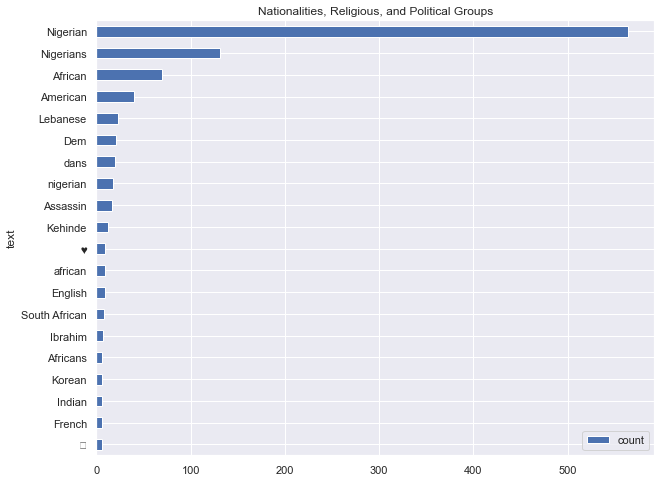

In [26]:
#plot 
df_norp.plot.barh(x='text', y='count', title="Nationalities, Religious, and Political Groups", figsize=(10,8)).invert_yaxis()

In [27]:
#view names of people
person_list = []
for ent in tokens.ents:
    if ent.label_ == 'PERSON':
        person_list.append(ent.text)
        
person_counts = Counter(person_list).most_common(20)
df_person = pd.DataFrame(person_counts, columns =['text', 'count'])

/Users/estherdokumensah/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 128514 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/estherdokumensah/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 128553 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/estherdokumensah/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 128514 missing from current font.
  font.set_text(s, 0, flags=flags)
/Users/estherdokumensah/opt/anaconda3/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 128553 missing from current font.
  font.set_text(s, 0, flags=flags)


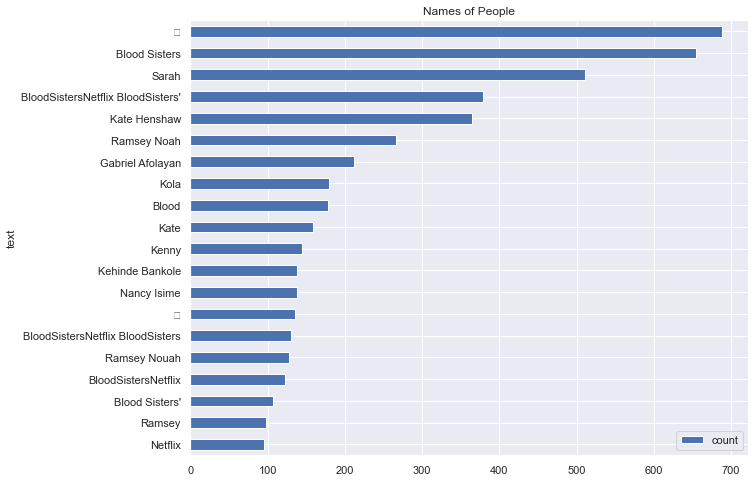

In [28]:
#plot 
df_person.plot.barh(x='text', y='count', title="Names of People", figsize=(10,8)).invert_yaxis()

In [29]:
gpe_list = []
for ent in tokens.ents:
    if ent.label_ == 'ORG':
        gpe_list.append(ent.text)
        
gpe_counts = Counter(gpe_list).most_common(20)
df_gpe = pd.DataFrame(gpe_counts, columns =['text', 'count'])
df_gpe

,text,count
0,BloodSisters,7879
1,🤣,585
2,Netflix,485
3,Blood,359
4,Bloodsisters,292
5,BloodSisters BloodSistersNetflix',234
6,👏,192
7,😂,113
8,Kola,112
9,Timeyin,111


In [30]:
#using spacy displacy function to view entities
doc = nlp(tokens)
displacy.serve(doc, style="ent")

/Users/estherdokumensah/opt/anaconda3/lib/python3.8/site-packages/spacy/displacy/__init__.py:98: UserWarning: [W011] It looks like you're calling displacy.serve from within a Jupyter notebook or a similar environment. This likely means you're already running a local web server, so there's no need to make displaCy start another one. Instead, you should be able to replace displacy.serve with displacy.render to show the visualization.
  warnings.warn(Warnings.W011)


OSError: [Errno 48] Address already in use

In [3]:
def get_tweet_sentiment(tweet): 
    # create TextBlob object of passed tweet text 
    analysis = TextBlob(tweet)
    # set sentiment 
    if analysis.sentiment.polarity > 0: 
        return 'positive'
    elif analysis.sentiment.polarity == 0: 
        return 'neutral'
    else: 
        return 'negative'
def main():
    global sampled_tweets
    sampled_tweets = []
    for index,row in tweet[['text']].iterrows():
        parsed_tweet = {}
        parsed_tweet['text'] = row['text']
        parsed_tweet['sentiment'] = get_tweet_sentiment(row['text'])
        sampled_tweets.append(parsed_tweet)
    global ptweets, ntweets, neutral_tweets

    ptweets = [tweet for tweet in sampled_tweets if tweet['sentiment'] == 'positive']
    ntweets = [tweet for tweet in sampled_tweets if tweet['sentiment'] == 'negative']
    neutral_tweets = [tweet for tweet in sampled_tweets if tweet['sentiment'] == 'neutral']

    print(f'Total Positive Tweets: {len(ptweets)}')
    print(f'Total Negative Tweets: {len(ntweets)}') 
    print("Total Neutral tweets: {}".format((len(sampled_tweets) - (len(ntweets)+len(ptweets))))) 

        
         
if __name__ == "__main__": 
    # calling main function 
    main() 

NameError: name 'tweet' is not defined